#########    All "our" in the following code refers to Joint Cabernet.

In [1]:
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import ternary
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

In [2]:
# "indir" is a custom input path, and "outdir" is a custom output path.
# indir=""
# outdir=""

In [ ]:
import matplotlib.font_manager
from matplotlib.font_manager import fontManager
indir = "/arial"
path = f"{indir}/arial.ttf"
fontManager.addfont(path)
matplotlib.rcParams['font.family'] = 'Arial'

In [ ]:
indir = "../04-Correlation_calculation/all_cell_correlation"
gene_df = pd.read_csv(f'{indir}/all_gene_upset_group_list.csv', header=0)

In [5]:
gene_df

,gene_id,group,mc_type,var_dim,gene_type,Correlation_5mC,new.P.value_5mC,new.P.adjust_5mC,Correlation_5hmC,new.P.value_5hmC,new.P.adjust_5hmC,Correlation_mC_hmC,new.P.value_mC_hmC,new.P.adjust_mC_hmC,gene_name,Cpg_number,Gene_length
0,ENSMUSG00000000085.16,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.055172,1.394032e-26,2.836335e-26,0.050302,3.166249e-23,8.310602e-23,-0.020340,6.275398e-05,1.094107e-04,Scmh1,828,124907
1,ENSMUSG00000000127.14,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.084406,4.029410e-63,1.112967e-62,0.084062,1.545731e-64,7.186262e-64,-0.018724,1.670712e-04,2.828985e-04,Fer,1731,243478
2,ENSMUSG00000000131.15,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.059576,6.884495e-31,1.470968e-30,0.054937,1.835579e-27,5.262715e-27,-0.024299,1.666483e-06,3.164198e-06,Xpo6,788,98788
3,ENSMUSG00000000168.9,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.035543,1.312279e-10,1.946831e-10,0.028705,9.310441e-08,1.460919e-07,-0.016877,1.728038e-03,2.748572e-03,Dlat,339,25149
4,ENSMUSG00000000184.12,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.058866,4.041673e-27,8.275400e-27,0.028481,8.532502e-08,1.341562e-07,-0.038829,3.473573e-13,7.911348e-13,Ccnd2,488,27033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3749,ENSMUSG00000116673.1,[5mCG -]:[5hmCG +],CG,genebody,all_gene,-0.030855,2.558572e-09,3.650531e-09,0.037370,2.004106e-13,4.024801e-13,-0.007121,1.621540e-01,2.014468e-01,RP23-49H16.3,455,81142
3750,ENSMUSG00000116760.1,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.182183,1.519444e-269,8.127454e-269,0.107030,4.061983e-97,2.374792e-96,-0.125869,3.936957e-134,2.110405e-133,RP23-17J18.33,1425,118721
3751,ENSMUSG00000116809.1,[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -],CG,genebody,all_gene,-0.077099,2.361639e-13,3.772008e-13,0.049613,4.975723e-10,8.752042e-10,-0.063796,2.441719e-15,5.781765e-15,RP24-548J11.7,23,4081
3752,ENSMUSG00000116858.1,[5mCG -]:[5hmCG +],CG,genebody,all_gene,-0.036285,2.721853e-12,4.198626e-12,0.036879,3.469273e-13,6.931404e-13,-0.009137,7.271668e-02,9.674784e-02,RP24-75N14.3,1220,113012


In [6]:
gene_df_group=gene_df.groupby("group")

In [7]:
for i in gene_df_group:
    print(i[0])

[(5mCG+5hmCG) +]
[(5mCG+5hmCG) -]
[5hmCG +]
[5hmCG +]:[(5mCG+5hmCG) +]
[5hmCG -]
[5hmCG -]:[(5mCG+5hmCG) -]
CG +]:[5hmCG -]
CG +]:[5hmCG -]:[(5mCG+5hmCG) -]
CG -]
CG -]:[(5mCG+5hmCG) -]
CG -]:[5hmCG +]
CG -]:[5hmCG +]:[(5mCG+5hmCG) +]
CG -]:[5hmCG +]:[(5mCG+5hmCG) -]
CG -]:[5hmCG -]:[(5mCG+5hmCG) -]


In [8]:
genes_df_group1 = gene_df_group.get_group("[5mCG -]:[5hmCG +]:[(5mCG+5hmCG) -]")

In [9]:
genes_df_group2 = gene_df_group.get_group("[5mCG -]:[5hmCG +]")

In [10]:
genes_df_group1.loc[genes_df_group1.index, ["sum_of_correlation"]] = \
    genes_df_group1[["Correlation_5mC","Correlation_5hmC","Correlation_mC_hmC"]].abs().sum(axis=1)

In [11]:
genes_df_group2.loc[genes_df_group2.index, ["sum_of_correlation"]] = \
    genes_df_group2[["Correlation_5mC","Correlation_5hmC"]].abs().sum(axis=1)

In [12]:
genes_df_group1_sorted = genes_df_group1.sort_values(by="sum_of_correlation", ascending=False)

In [13]:
genes_df_group2_sorted = genes_df_group2.sort_values(by="sum_of_correlation", ascending=False)

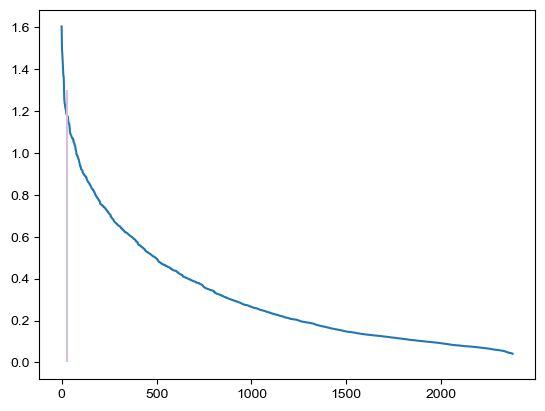

In [14]:
plt.plot(range(len(genes_df_group1_sorted)), genes_df_group1_sorted["sum_of_correlation"])
plt.vlines([30], 0, 1.3, color='thistle')

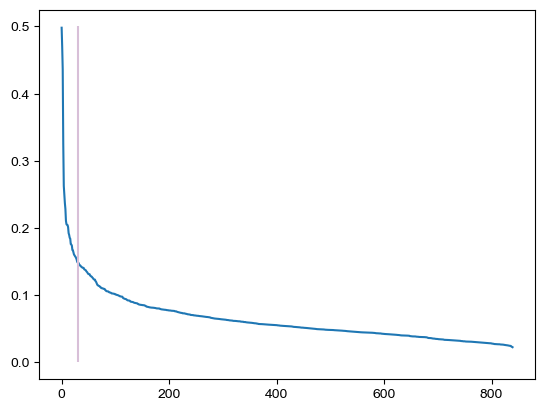

In [15]:
plt.plot(range(len(genes_df_group2_sorted)), genes_df_group2_sorted["sum_of_correlation"])
plt.vlines([30], 0, 0.5, color='thistle')

In [16]:
np.sum(genes_df_group2_sorted["sum_of_correlation"]>0.1)

106

In [17]:
genes_df_group1_sorted.shape

(2376, 18)

In [18]:
genes_df_group2_sorted.shape

(840, 18)

In [19]:
# let's plot the top 40 genes

In [ ]:
# "indir" is a custom input path, and "outdir" is a custom output path.
indir = ""  # h5ad file path
# outdir=""

In [ ]:
meta_data=pd.read_csv("../../../03.data/02.metainfo/01.Young_Mouse/RNA_DNA_match_name_QC_class_label_young.csv",header=0)
meta_data2=meta_data[meta_data["total_QC"]==1]

In [22]:
df_total5mC = ad.read_h5ad(f"{indir}/5mC_genebody.CG.pass_total_QC.h5ad").to_df()

In [23]:
df_5hmC = ad.read_h5ad(f"{indir}/5hmC_genebody.CG.pass_total_QC.h5ad").to_df()

In [ ]:
rds_data = ro.r['readRDS']("../04-Correlation_calculation/sc_RNA_expression_log1p_normalized_data.rds")
rds_df = pandas2ri.rpy2py(rds_data)

from scipy.sparse import issparse
issparse(rds_df)

False

In [ ]:
df_RNA = rds_df.T


In [37]:
df_RNA = df_RNA.loc[meta_data2['RNA_SampleID'],]

In [38]:
df_RNA

,ENSMUSG00000102693.1,ENSMUSG00000064842.1,ENSMUSG00000051951.5,ENSMUSG00000102851.1,ENSMUSG00000103377.1,ENSMUSG00000104017.1,ENSMUSG00000103025.1,ENSMUSG00000089699.1,ENSMUSG00000103201.1,ENSMUSG00000103147.1,...,ENSMUSG00000024997.7,ENSMUSG00000003228.8,ENSMUSG00000096578.1,ENSMUSG00000088894.1,ENSMUSG00000074733.14,ENSMUSG00000070263.1,ENSMUSG00000094649.1,ENSMUSG00000069475.1,ENSMUSG00000059326.6,ENSMUSG00000095993.1
P49_Male_LeftCortex_TSO_RNA_plate1.AACCAGAG,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.365908,0.0,0.0,0.0,0.000000,0.0
P49_Male_LeftCortex_TSO_RNA_plate1.AAGACACC,0.0,0.0,2.134026,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
P49_Male_LeftCortex_TSO_RNA_plate1.AAGACCGT,0.0,0.0,2.313799,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
P49_Male_LeftCortex_TSO_RNA_plate1.AGACCTTG,0.0,0.0,2.197057,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
P49_Male_LeftCortex_TSO_RNA_plate1.AGACGCTA,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P56_Male_SuperficialCortex_TSO_RNA_plate99.TGGTGAAG,0.0,0.0,3.750095,0.056684,0.0,0.0,0.0,0.056684,0.0,0.0,...,0.0,0.000000,0.0,0.0,1.149909,0.0,0.0,0.0,0.000000,0.0
P56_Male_SuperficialCortex_TSO_RNA_plate99.TTACCGAC,0.0,0.0,2.370433,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.341111,0.0,0.0,0.0,0.052783,0.0
P56_Male_SuperficialCortex_TSO_RNA_plate99.TTACGTGC,0.0,0.0,2.096530,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,1.723674,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0
P56_Male_SuperficialCortex_TSO_RNA_plate99.TTCCAGGT,0.0,0.0,3.791009,0.000000,0.0,0.0,0.0,0.044480,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.737941,0.0,0.0,0.0,0.000000,0.0


In [ ]:
genes_df = pd.read_csv('../../../03.data/01.ref/mm10.genes.bed', sep='\t', header=None, names=['chromosome', 'start', 'end', 'gene_id', 'gene_name', 'gene_type', 'strand'])

In [40]:
outdir = './'

In [61]:
import os
os.mkdir('plot_group1')
os.mkdir('plot_group2')

  0%|          | 0/40 [00:00<?, ?it/s]

/tmp/ipykernel_8324/3358722415.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax,cbar_ax) = plt.subplots(1,2,


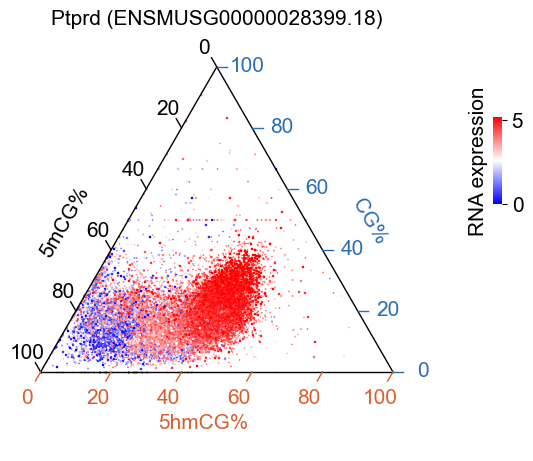

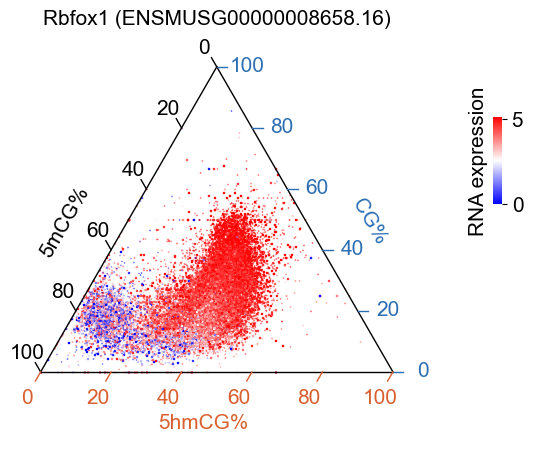

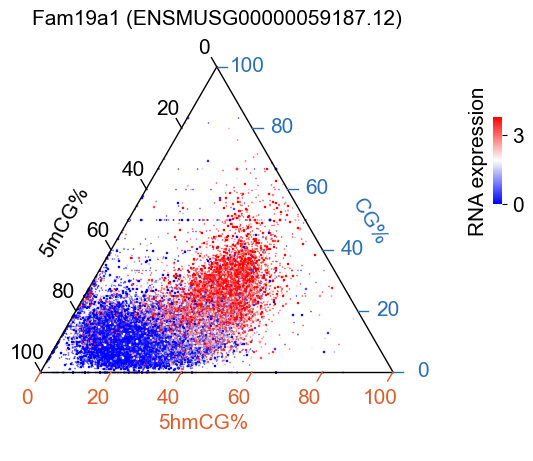

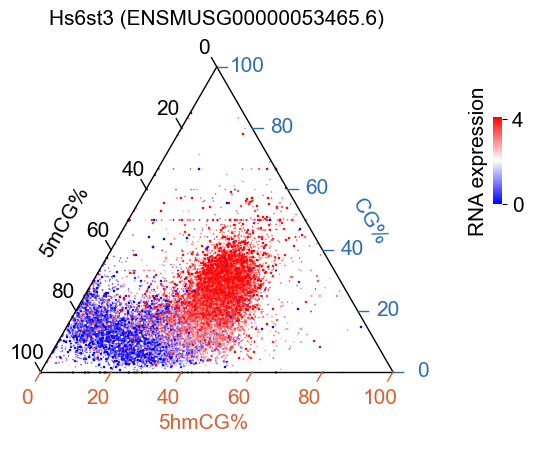

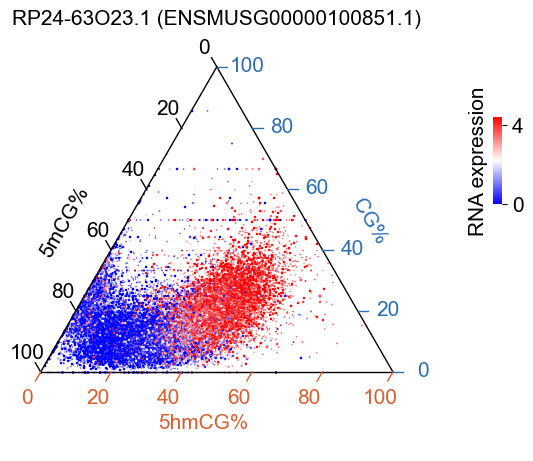

...

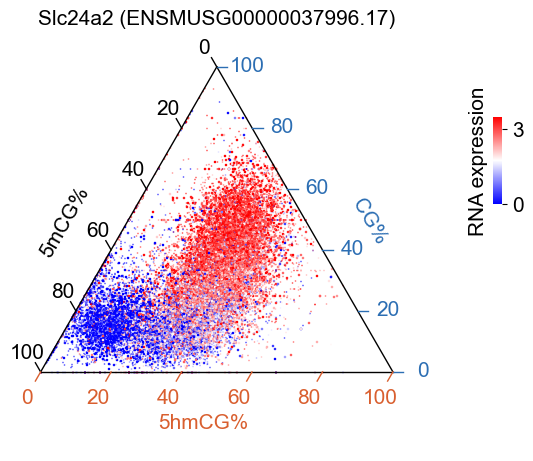

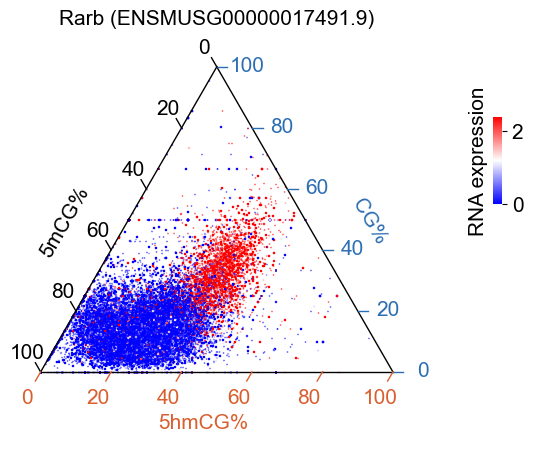

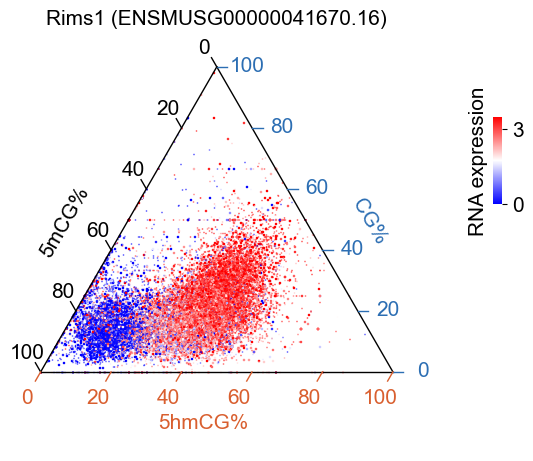

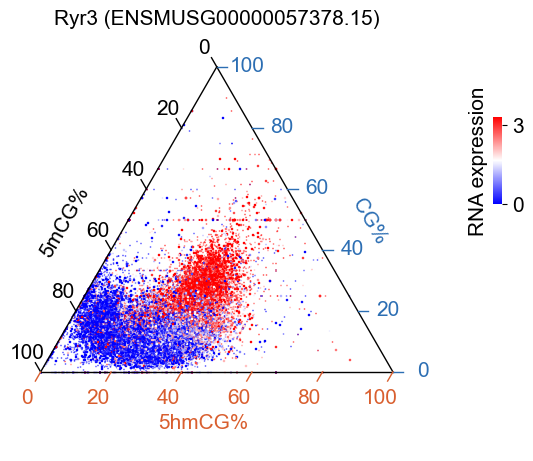

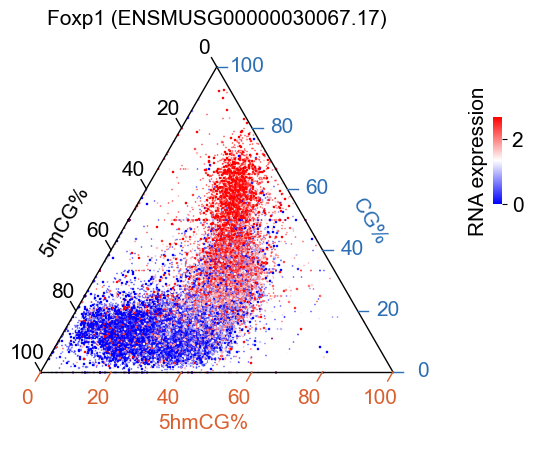

In [41]:
for gene_ in tqdm(genes_df_group1_sorted.iloc[:40,0]):
    gene_name=genes_df[genes_df["gene_id"]==gene_]["gene_name"].iloc[0]

    data_RNA=df_RNA.loc[meta_data2["RNA_SampleID"], gene_]
    data_RNA.index=meta_data2["unique_id"]

    data_total5mC=df_total5mC.loc["allc_"+meta_data2["mC_SampleID"], gene_]
    data_total5mC.index=meta_data2["unique_id"]

    data_5hmC=df_5hmC.loc["allc_"+meta_data2["hmC_SampleID"], gene_]
    data_5hmC.index=meta_data2["unique_id"]

    data_5mC=data_total5mC-data_5hmC
    # note that data_5mC may contain negative values


    plt.rcParams["figure.autolayout"] = True
    temp_scale=3
    
    ## Boundary and Gridlines
    fig, (ax,cbar_ax) = plt.subplots(1,2,
                                     figsize=(temp_scale*46/25.4, temp_scale*40/25.4),
                                    width_ratios=[40,6])
    ax.set_aspect('equal')
    
    scale = 100
    figure, tax = ternary.figure(scale=scale,ax=ax)
    #figure.set_size_inches(temp_scale*60/25.4, temp_scale*60/25.4)
    tax.set_background_color("white")
    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1)
    #tax.gridlines(color="black", multiple=6)
    #tax.gridlines(color="blue", multiple=2, linewidth=0.5)

    data_of_points=pd.concat([data_5hmC, 1-data_total5mC, data_5mC, data_RNA],axis=1)
    # bottom, right, left is the default order
    # remove negative true 5mC points
    data_of_points=data_of_points[data_5mC>=0]
    
    points = data_of_points.iloc[:,:3].to_numpy()*100
    
    color_data = data_of_points.iloc[:,3]
    vmax_RNA=np.floor(np.quantile(data_RNA, 0.9)*10)/10
    
    # Scatter plot with colors
    tax.scatter(points, marker=',', c=color_data, cmap='bwr', s=0.1,
                vmin=0, vmax=vmax_RNA)

    # Set Axis labels and Title
    fontsize = temp_scale*5
    tax.set_title(f"{gene_name} ({gene_})\n", fontsize=fontsize)
    tax.left_axis_label("5mCG%", fontsize=fontsize, offset=0.18,color="black")
    tax.right_axis_label("CG%", fontsize=fontsize, offset=0.18,color="#2C6EB3")
    tax.bottom_axis_label("5hmCG%", fontsize=fontsize, offset=0.14,color="#D95F2F")
    
    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=20, offset=0.03, fontsize=fontsize,
             clockwise=False, axes_colors={"l":"black", "b":"#D95F2F", "r":"#2C6EB3"})
    
    # set colorbar
    sm = plt.cm.ScalarMappable(cmap='bwr',
                norm=plt.Normalize(vmin=0, vmax=vmax_RNA))
    sm.set_array([])
    # Create an axis for the color bar to prevent overlap
    cbar=plt.colorbar(sm, ax=cbar_ax, shrink=1,aspect=10,
                 location="right", anchor=(0,0.7),ticks=[0,int(vmax_RNA)], format='%d')
    cbar.ax.tick_params(labelsize=fontsize)
    #cbar.ax.set_yticks((0, vmax_RNA))
    cbar.ax.set_ylabel("RNA expression", fontsize=fontsize)
    cbar.ax.yaxis.set_label_position('left')
    cbar_ax.axis("off")
    # Disable edges of the colorbar
    for spine in cbar.ax.spines.values():
        spine.set_visible(False)
    
    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')

    #break
    
    ternary.plt.savefig(f"{outdir}/plot_group1/{gene_name}.pdf")
    #ternary.plt.show()
    #break

  0%|          | 0/40 [00:00<?, ?it/s]

/tmp/ipykernel_8324/2514938108.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax,cbar_ax) = plt.subplots(1,2,


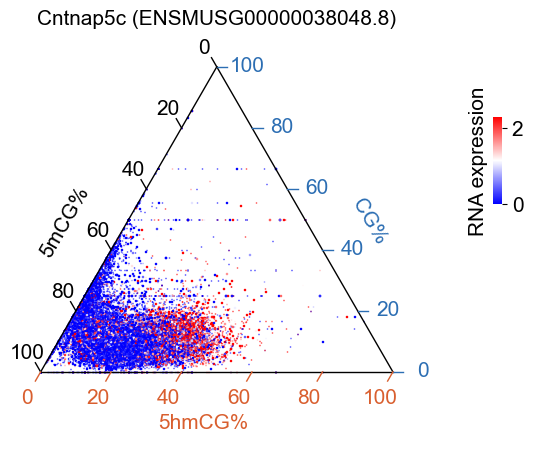

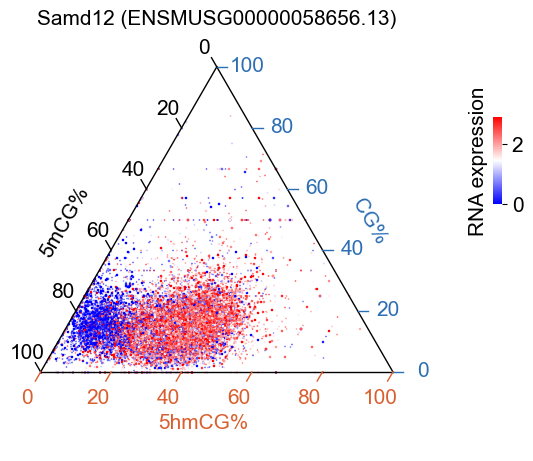

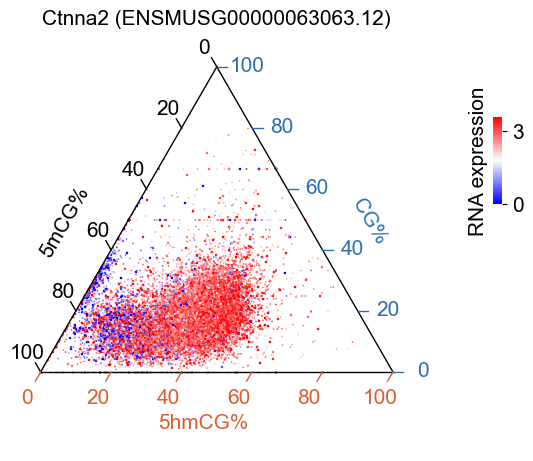

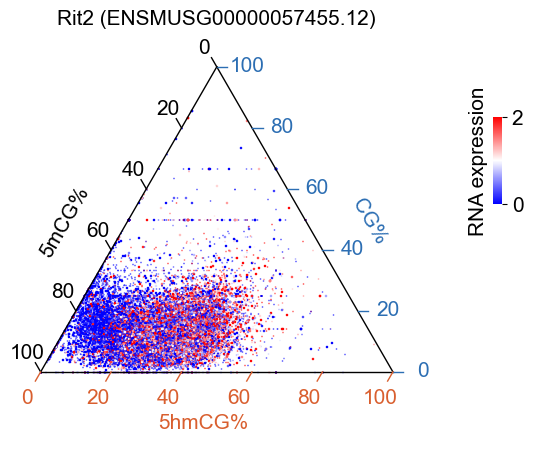

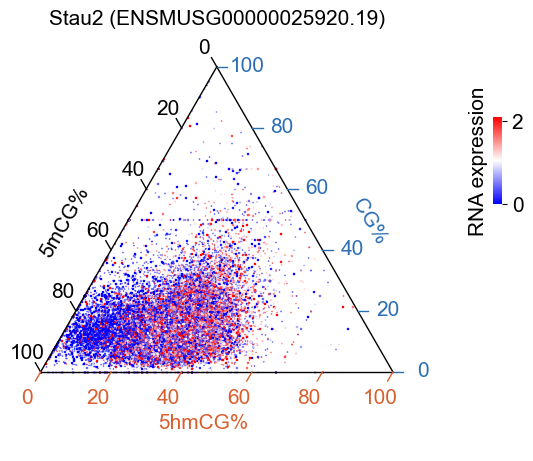

...

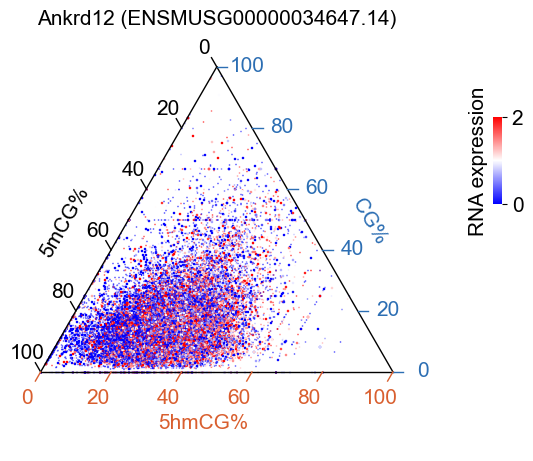

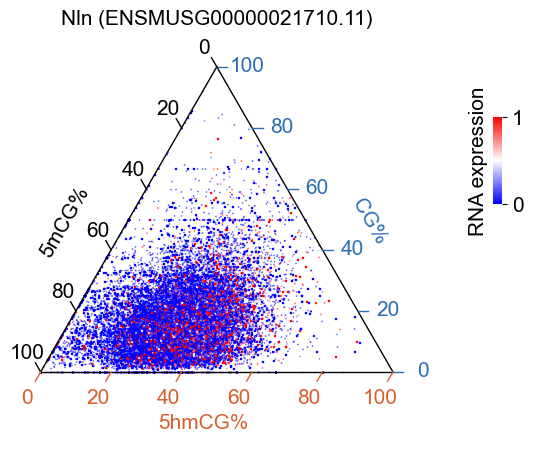

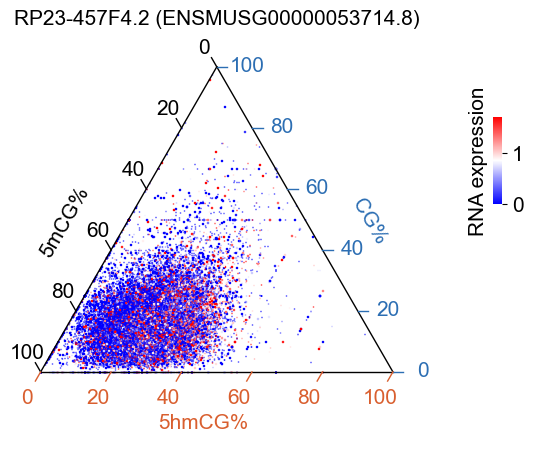

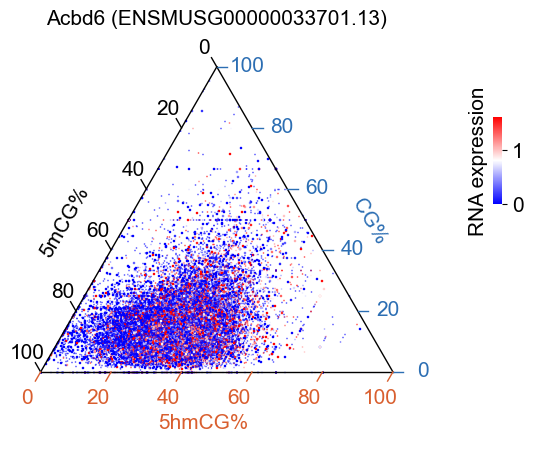

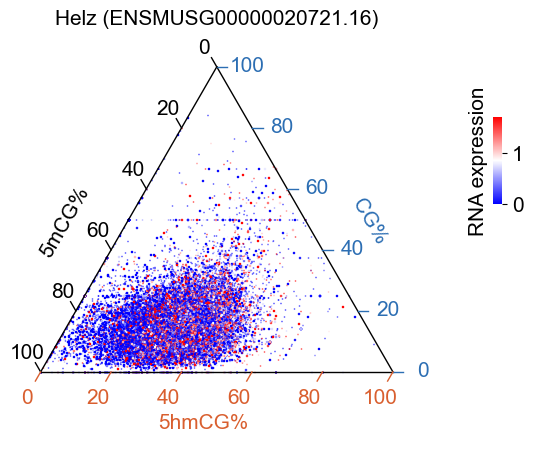

In [42]:
for gene_ in tqdm(genes_df_group2_sorted.iloc[:40,0]):
    gene_name=genes_df[genes_df["gene_id"]==gene_]["gene_name"].iloc[0]

    data_RNA=df_RNA.loc[meta_data2["RNA_SampleID"], gene_]
    data_RNA.index=meta_data2["unique_id"]

    data_total5mC=df_total5mC.loc["allc_"+meta_data2["mC_SampleID"], gene_]
    data_total5mC.index=meta_data2["unique_id"]

    data_5hmC=df_5hmC.loc["allc_"+meta_data2["hmC_SampleID"], gene_]
    data_5hmC.index=meta_data2["unique_id"]

    data_5mC=data_total5mC-data_5hmC
    # note that data_5mC may contain negative values


    plt.rcParams["figure.autolayout"] = True
    temp_scale=3
    
    ## Boundary and Gridlines
    fig, (ax,cbar_ax) = plt.subplots(1,2,
                                     figsize=(temp_scale*46/25.4, temp_scale*40/25.4),
                                    width_ratios=[40,6])
    ax.set_aspect('equal')
    
    scale = 100
    figure, tax = ternary.figure(scale=scale,ax=ax)
    #figure.set_size_inches(temp_scale*60/25.4, temp_scale*60/25.4)
    tax.set_background_color("white")
    # Draw Boundary and Gridlines
    tax.boundary(linewidth=1)
    #tax.gridlines(color="black", multiple=6)
    #tax.gridlines(color="blue", multiple=2, linewidth=0.5)

    data_of_points=pd.concat([data_5hmC, 1-data_total5mC, data_5mC, data_RNA],axis=1)
    # bottom, right, left is the default order
    # remove negative true 5mC points
    data_of_points=data_of_points[data_5mC>=0]
    
    points = data_of_points.iloc[:,:3].to_numpy()*100
    
    color_data = data_of_points.iloc[:,3]
    vmax_RNA=np.floor(np.quantile(data_RNA, 0.9)*10)/10
    
    # Scatter plot with colors
    tax.scatter(points, marker=',', c=color_data, cmap='bwr', s=0.1,
                vmin=0, vmax=vmax_RNA)

    # Set Axis labels and Title
    fontsize = temp_scale*5
    tax.set_title(f"{gene_name} ({gene_})\n", fontsize=fontsize)
    tax.left_axis_label("5mCG%", fontsize=fontsize, offset=0.18,color="black")
    tax.right_axis_label("CG%", fontsize=fontsize, offset=0.18,color="#2C6EB3")
    tax.bottom_axis_label("5hmCG%", fontsize=fontsize, offset=0.14,color="#D95F2F")
    
    # Set ticks
    tax.ticks(axis='lbr', linewidth=1, multiple=20, offset=0.03, fontsize=fontsize,
             clockwise=False, axes_colors={"l":"black", "b":"#D95F2F", "r":"#2C6EB3"})
    
    # set colorbar
    sm = plt.cm.ScalarMappable(cmap='bwr',
                norm=plt.Normalize(vmin=0, vmax=vmax_RNA))
    sm.set_array([])
    # Create an axis for the color bar to prevent overlap
    cbar=plt.colorbar(sm, ax=cbar_ax, shrink=1,aspect=10,
                 location="right", anchor=(0,0.7),ticks=[0,int(vmax_RNA)], format='%d')
    cbar.ax.tick_params(labelsize=fontsize)
    #cbar.ax.set_yticks((0, vmax_RNA))
    cbar.ax.set_ylabel("RNA expression", fontsize=fontsize)
    cbar.ax.yaxis.set_label_position('left')
    cbar_ax.axis("off")
    # Disable edges of the colorbar
    for spine in cbar.ax.spines.values():
        spine.set_visible(False)
    
    # Remove default Matplotlib Axes
    tax.clear_matplotlib_ticks()
    tax.get_axes().axis('off')
    
    ternary.plt.savefig(f"{outdir}/plot_group2/{gene_name}.pdf")
    #ternary.plt.show()
    #break